<div style='background-color: #fff7f7; border: 3px solid Red;'>
    <font size="+1" color="Red">
        <b>Please comment and upvote if you like this work!</b>
    </font>
</div>
<div style='background-color: #fff7f7; border: 3px solid Blue;'>
    <font size="+1" color="Red">
        <b>Take a look at the other notebooks in my profile ->
        <a href="https://www.kaggle.com/killa92/code">  Kaggle Notebooks </a></b>
    </font>
</div>    
<div style='background-color: #fff7f7; border: 3px solid yellow;'>
    <font size="+1" color="Red">
        <b><span style='color: green;'>Let's Support Each Other!!</span></b>
    </font>
</div>

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>🗂1. Install libraries and Download a pre-trained checkpoint 🗂</b></font>
</div>

In [1]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.6/914.6 kB 15.0 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 77.6MB/s]


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📈 2. Data Analysis 📈</b></font>
</div>

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



<ipython-input-2-1a71c562e2aa>:110: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(cls_names)


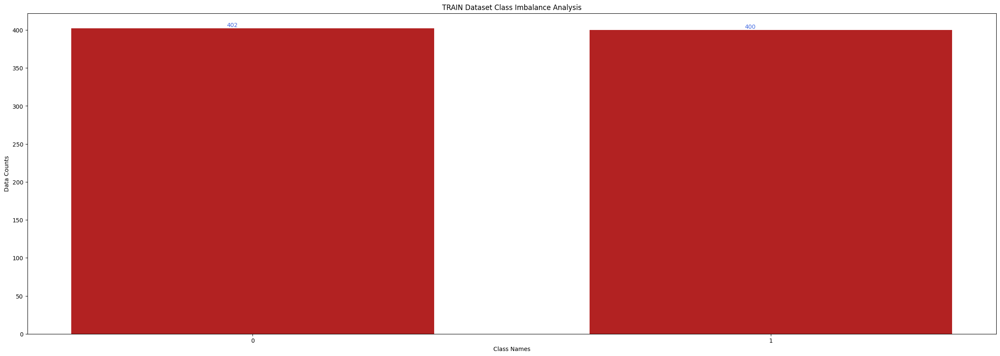

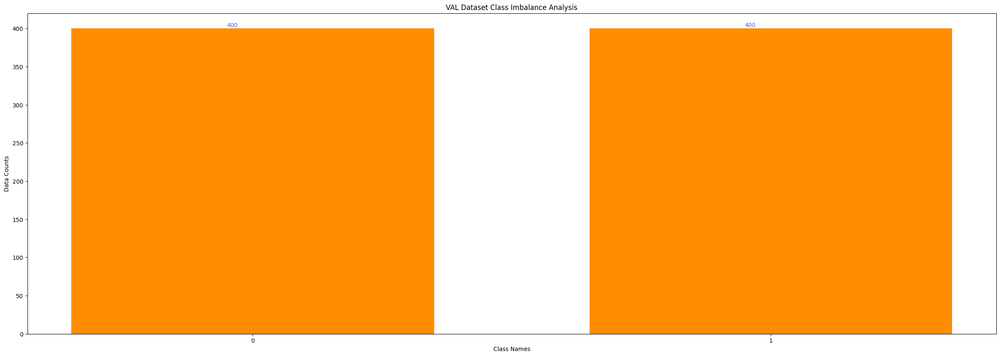

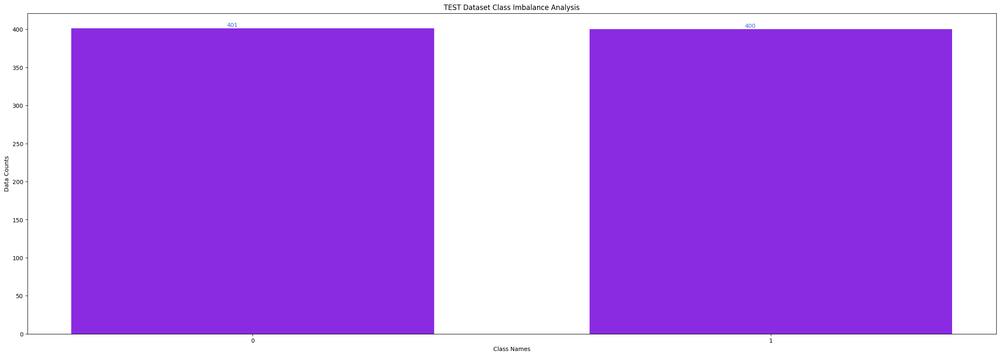

In [2]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, root, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]
        
        self.get_cls_names(); self.get_bboxes()        
                
    def get_cls_names(self):

        with open(f"{root}/dataset.yaml", 'r') as file: data = yaml.safe_load(file)      
        # Extract class names
        class_names = data['names']        
        
        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}        
    
    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{root}/images/{data_type}/*")            
            
            for idx, im_path in enumerate(im_paths):
                # if idx == 3: break                
                bboxes = []
                im_ext = os.path.splitext(im_path)[-1]
                lbl_path = im_path.replace(im_ext, ".txt")
                lbl_path  = lbl_path.replace(f"images/{data_type}/", f"labels/{data_type}/")
                if not os.path.isfile(lbl_path): continue                
                meta_data = open(lbl_path).readlines()
                for data in meta_data:                    
                    # Split the string by space and strip the newline character
                    # Change here 
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)
                    
            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths
    
    def plot(self, rows, cols, count, im_path, bboxes):
    
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:
            
            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max
            
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There is (are) {len(bboxes)} object(s) in the image.")
        
        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1
        
        plt.figure(figsize = (25, 20))
                
        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):
        
            if count == self.n_ims + 1: break
            
            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)
            
        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")
        
        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())
        
        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")
    
    def visualization(self): [self.vis(save_name) for save_name in self.data_types]
        
    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]
        
root = "/kaggle/input/optic-disc-and-optic-cup-detection-yolov8-format/dataset"
vis = Visualization(root = root, data_types = ["train", "val", "test"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📊 3. Data Visualization 📊</b></font>
</div>

TRAIN Data Visualization is in process...



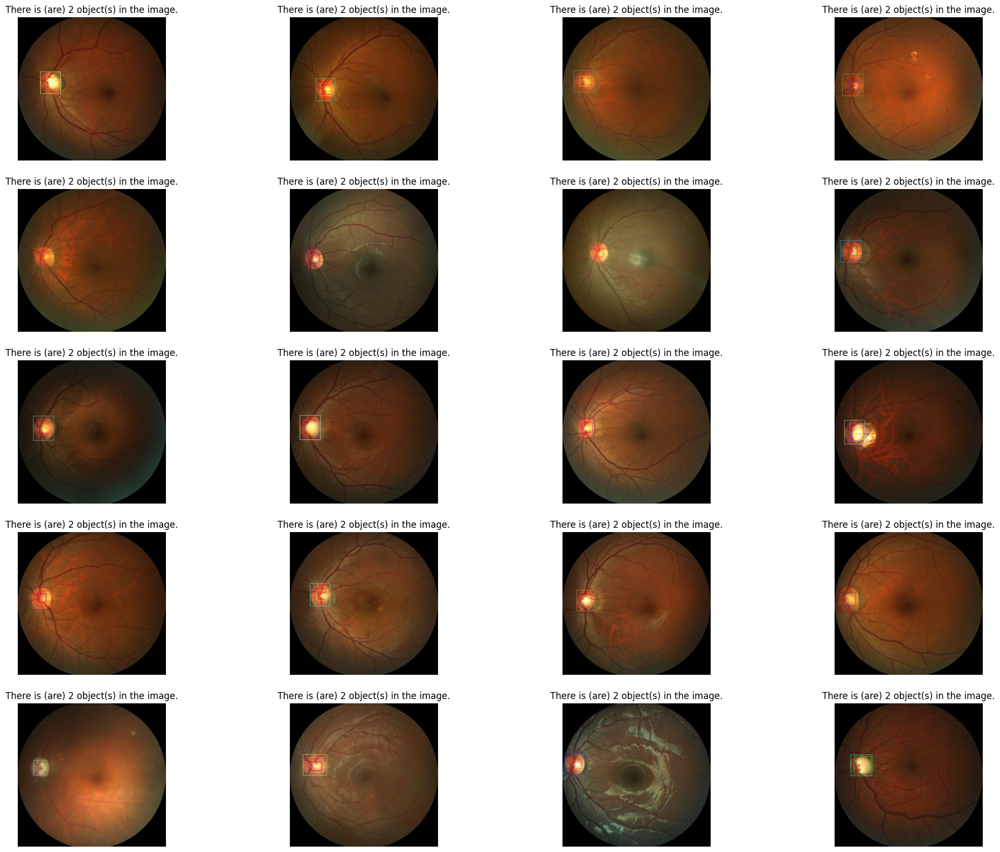

VAL Data Visualization is in process...



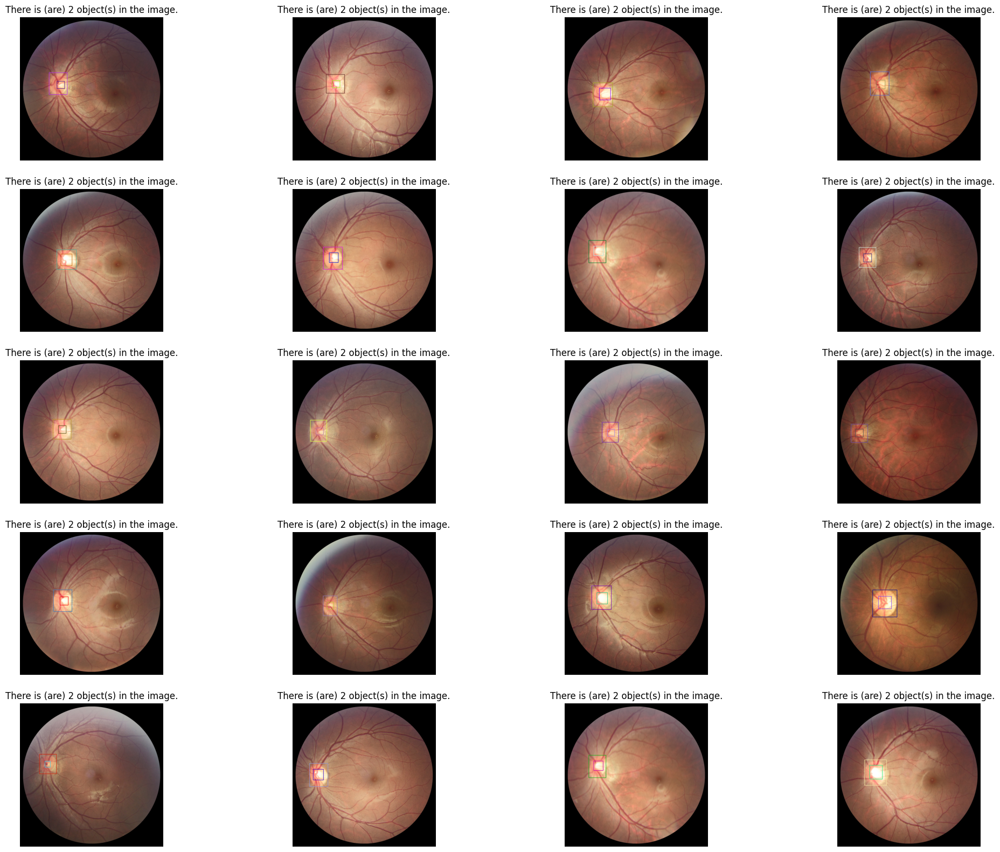

TEST Data Visualization is in process...



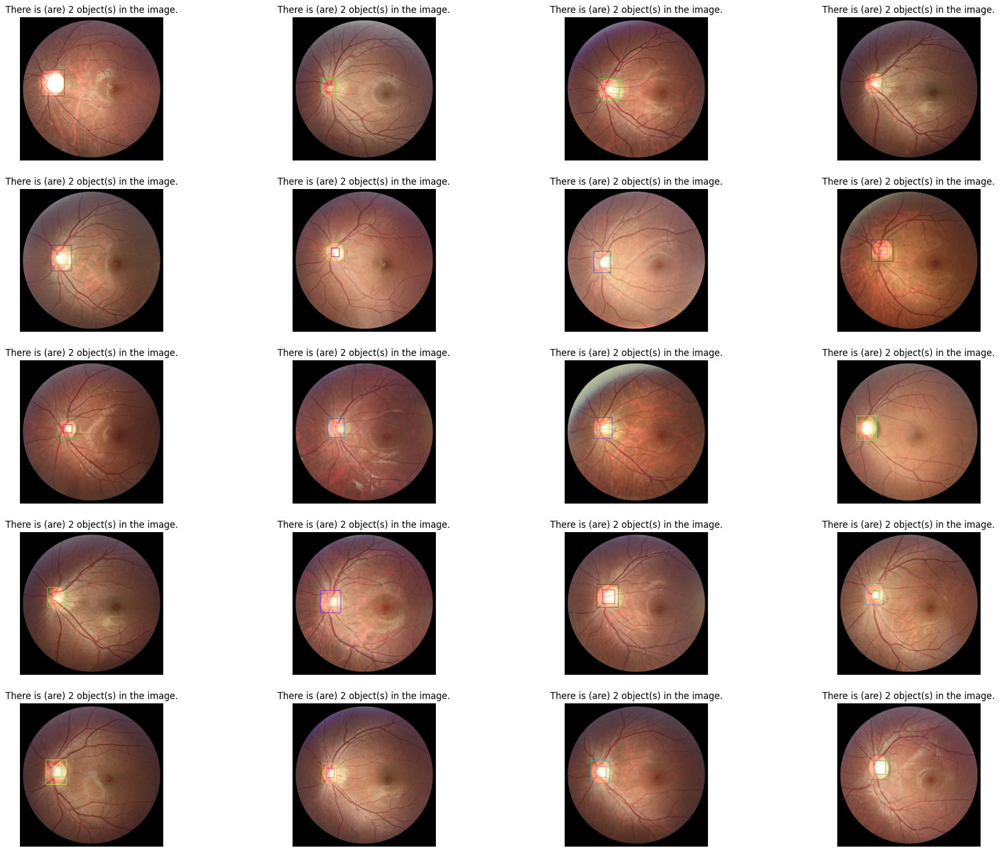

In [3]:
vis.visualization()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✨ 4. AI Model Train✨</b></font>
</div>

In [4]:
train_results = model.train(    
    data=f"{root}/dataset.yaml",
    epochs=10,  # number of training epochs
    imgsz=480,  # training image size
    device=[0,1])  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu

Ultralytics 8.3.69 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/input/optic-disc-and-optic-cup-detection-yolov8-format/dataset/dataset.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fa

100%|██████████| 755k/755k [00:00<00:00, 17.7MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>😍 5. Learning Curves 😍</b></font>
</div>

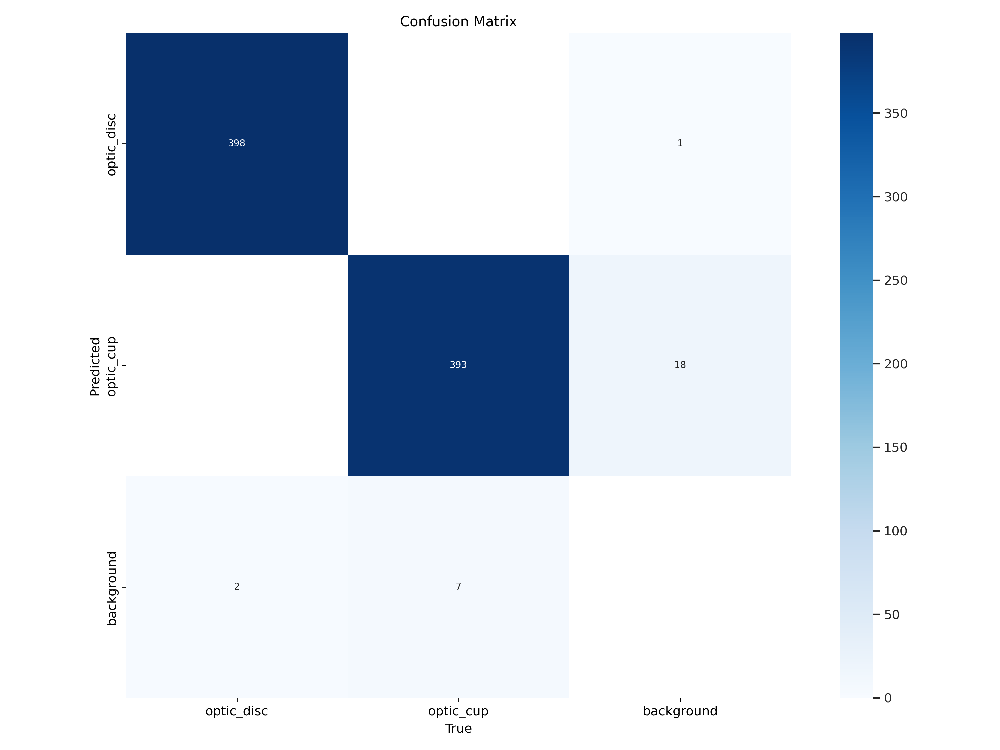

In [5]:
Image.open(f"runs/detect/train/confusion_matrix.png")

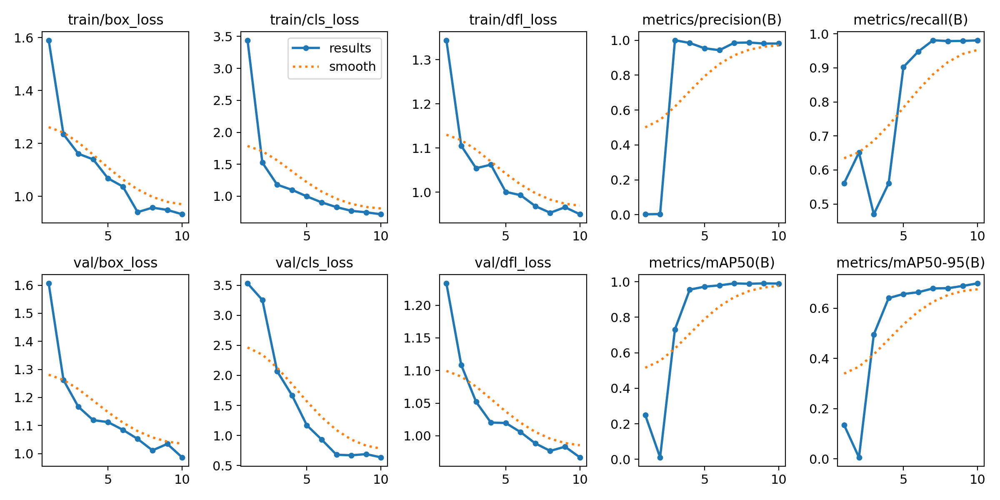

In [6]:
Image.open(f"runs/detect/train/results.png")

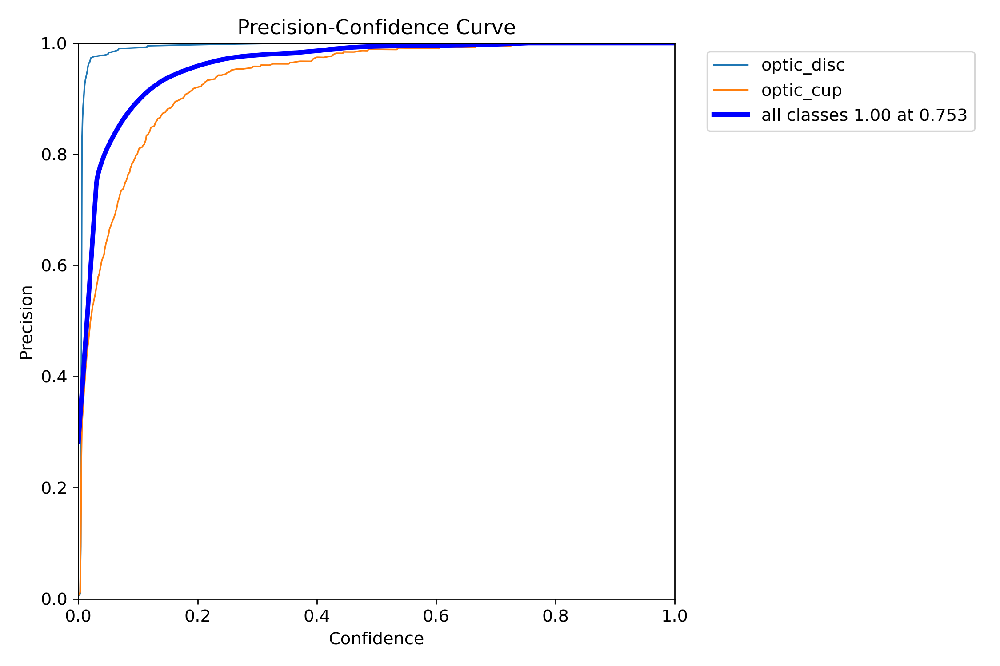

In [7]:
Image.open(f"runs/detect/train/P_curve.png")

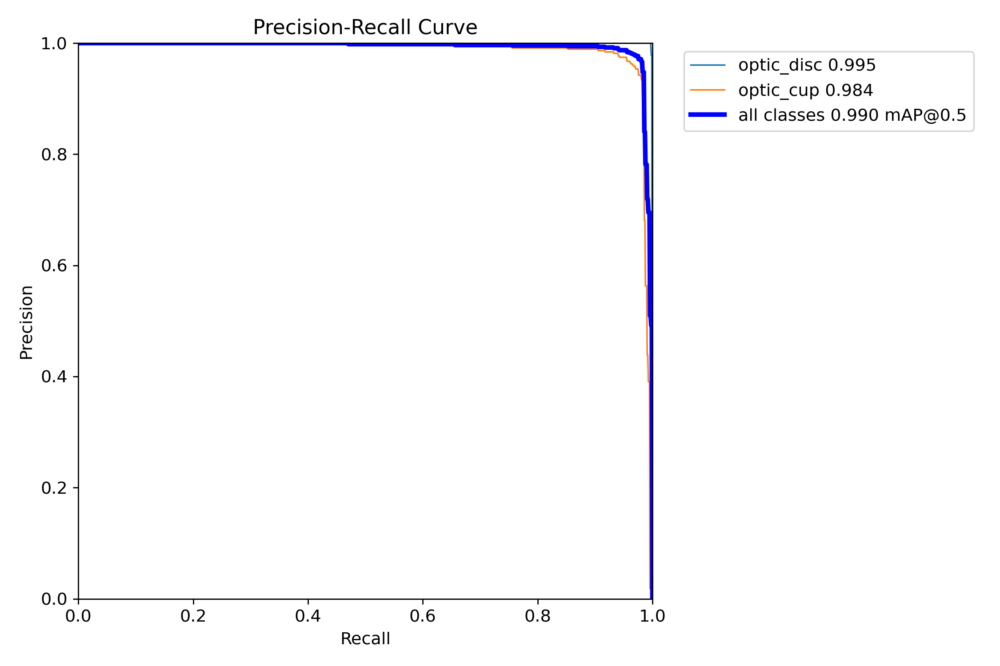

In [8]:
Image.open(f"runs/detect/train/PR_curve.png")

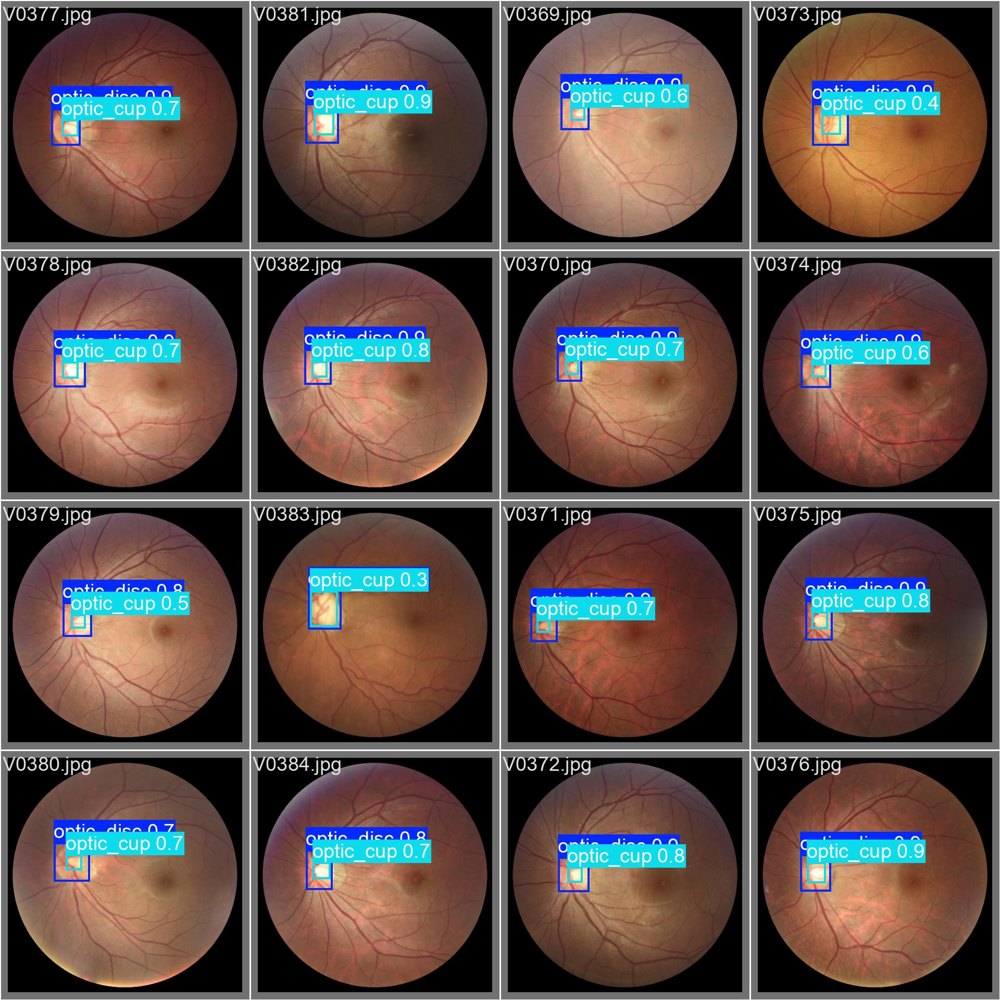

In [9]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✅6. Inference with Test Dataset✅</b></font>
</div>

In [10]:
inference_results = model(f"{root}/images/test", device = 0, verbose = False)

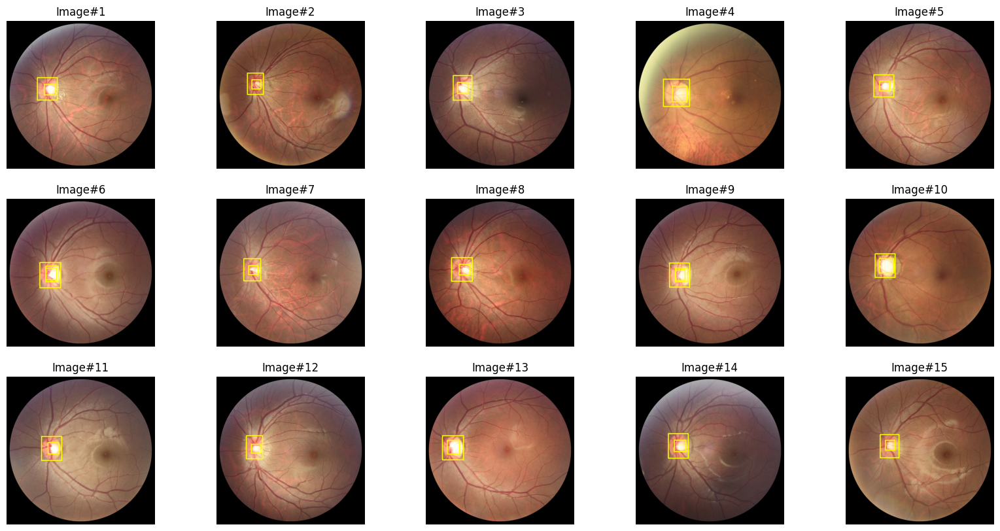

In [11]:
def inference_vis(res, n_ims, rows):
    cols = n_ims // rows
    plt.figure(figsize = (20, 10))
    for idx, r in enumerate(res):
        if idx == n_ims: break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        if idx == n_ims: break    
        for i in r:
            for bbox in i.boxes:
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,255,0), thickness=10)
        plt.imshow(or_im_rgb)
        plt.title(f"Image#{idx + 1}")
        plt.axis("off")
inference_vis(res = inference_results, n_ims = 15, rows = 3)